In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
pd.set_option("display.max_columns", None)

In [6]:
pd.options.display.float_format = '{:.2f}'.format

In [7]:
df = pd.read_csv("data/fraudTrain.csv")
df.sample(5)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
47158,47158,2019-01-28 18:16:00,3534330126107879,"fraud_Ritchie, Bradtke and Stiedemann",travel,517.05,Jeffrey,Smith,M,713 Scott Pike Apt. 712,Bridger,MT,59014,45.29,-108.91,1446,Chartered loss adjuster,1978-01-15,5ca5a633a54029326fa01b1de27e6ac6,1327774560,45.91,-109.48,0
440643,440643,2019-07-15 09:43:17,676102124465,fraud_Friesen-D'Amore,gas_transport,64.47,Natasha,Mclaughlin,F,8699 Lindsay Ford Apt. 486,Napa,CA,94558,38.45,-122.26,94014,Airline pilot,1985-08-21,479fc8087ab826b0e9abd0fecb03bf17,1342345397,39.45,-121.76,0
325560,325560,2019-06-04 08:57:26,3540075240003197,fraud_Paucek-Wiza,grocery_net,51.98,Christian,Johns,M,892 Solis Neck,Lonsdale,MN,55046,44.45,-93.43,5211,Chief Strategy Officer,1987-01-27,f1e3aebcec7174628aee1c9b547da063,1338800246,44.08,-94.01,0
798952,798952,2019-12-03 22:20:45,3567697931646329,fraud_Fadel-Hilpert,health_fitness,75.35,John,Stevens,M,428 Morgan River,Hudson,NY,12534,42.25,-73.76,17867,Travel agency manager,1998-07-29,f64b595986d075f36e36cf7b60f7280f,1354573245,42.16,-73.37,0
342039,342039,2019-06-10 09:08:22,4260059589824237,fraud_Stamm-Rodriguez,misc_pos,4.62,Aaron,Rogers,M,969 Huerta Path Apt. 270,Valentine,NE,69201,42.81,-100.62,4005,Network engineer,1945-03-15,24c7188fd54c2652cc9d157f7c17d339,1339319302,43.13,-101.07,0


In [8]:
df.shape

(1296675, 23)

## trans_date_trans_time

In [5]:
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])

In [6]:
df['trans_date_trans_time'].describe()

count                          1296675
mean     2019-10-03 12:47:28.070214144
min                2019-01-01 00:00:18
25%         2019-06-03 19:12:22.500000
50%                2019-10-03 07:35:47
75%         2020-01-28 15:02:55.500000
max                2020-06-21 12:13:37
Name: trans_date_trans_time, dtype: object

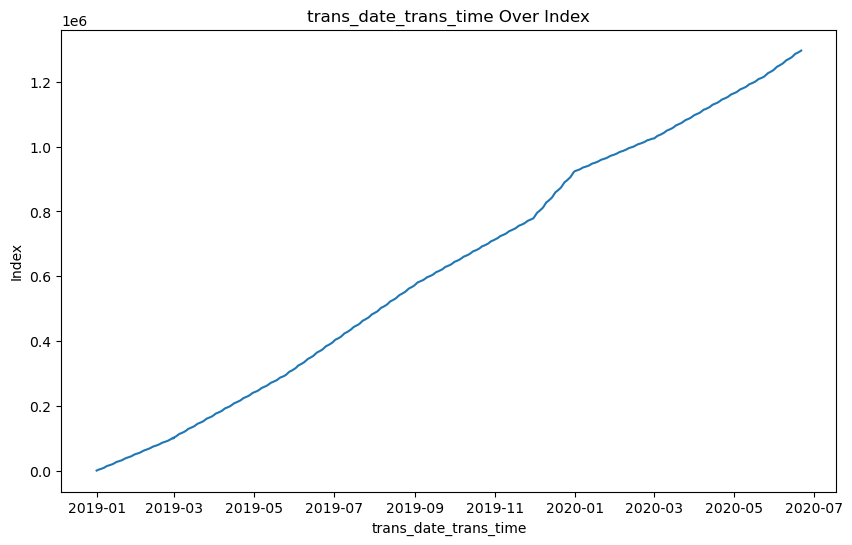

In [8]:
# Plotting the data over time
plt.figure(figsize=(10, 6))
plt.plot(df['trans_date_trans_time'], range(len(df)))
plt.xlabel('trans_date_trans_time')
plt.ylabel('Index')
plt.title('trans_date_trans_time Over Index')
plt.show()

In [10]:
# Check for missing values
df['trans_date_trans_time'].isnull().sum()

0

In [12]:
temp = df[['trans_date_trans_time']]

# Extracting components
temp['year'] = temp['trans_date_trans_time'].dt.year
temp['month'] = temp['trans_date_trans_time'].dt.month
temp['day'] = temp['trans_date_trans_time'].dt.day
temp['hour'] = temp['trans_date_trans_time'].dt.hour
temp['minute'] = temp['trans_date_trans_time'].dt.minute
temp['second'] = temp['trans_date_trans_time'].dt.second
temp['day_of_week'] = temp['trans_date_trans_time'].dt.dayofweek
temp['week_of_year'] = temp['trans_date_trans_time'].dt.isocalendar().week

# Inspecting the data with new columns
temp.head()

C:\Users\Acer\AppData\Local\Temp\ipykernel_3540\3581253785.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp['year'] = temp['trans_date_trans_time'].dt.year
C:\Users\Acer\AppData\Local\Temp\ipykernel_3540\3581253785.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp['month'] = temp['trans_date_trans_time'].dt.month
C:\Users\Acer\AppData\Local\Temp\ipykernel_3540\3581253785.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

,trans_date_trans_time,year,month,day,hour,minute,second,day_of_week,week_of_year
0,2019-01-01 00:00:18,2019,1,1,0,0,18,1,1
1,2019-01-01 00:00:44,2019,1,1,0,0,44,1,1
2,2019-01-01 00:00:51,2019,1,1,0,0,51,1,1
3,2019-01-01 00:01:16,2019,1,1,0,1,16,1,1
4,2019-01-01 00:03:06,2019,1,1,0,3,6,1,1


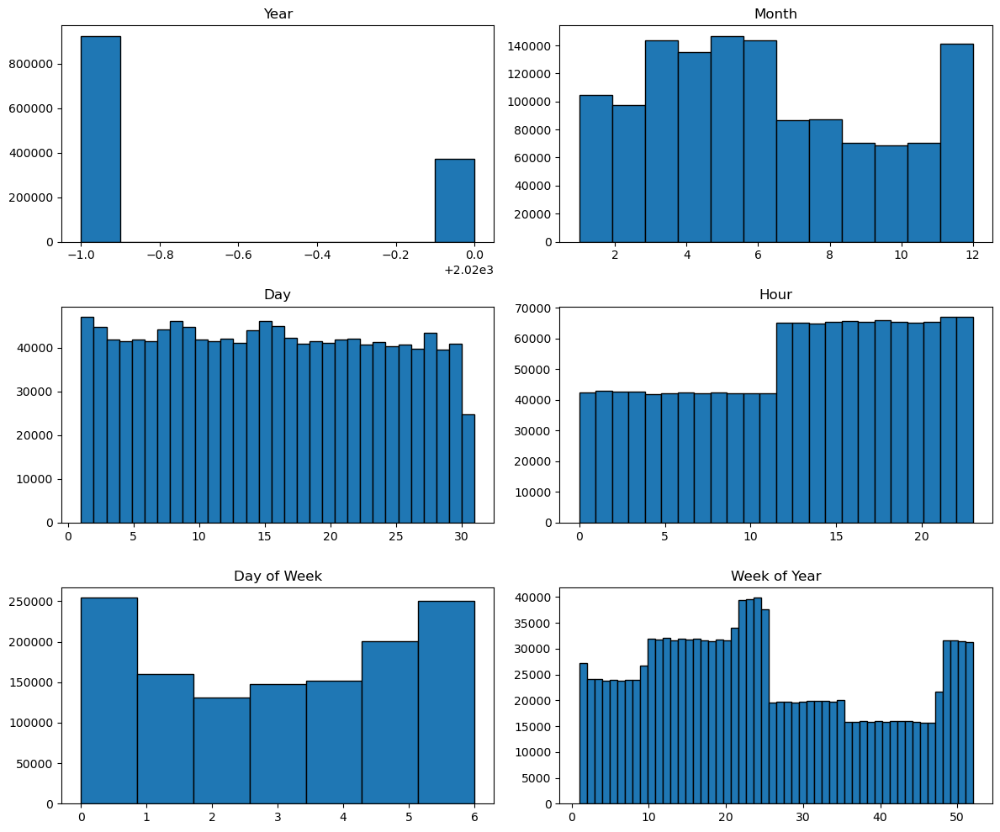

In [39]:
# Histograms of different time components
fig, axs = plt.subplots(3, 2, figsize=(12, 10))
axs[0, 0].hist(temp['year'], bins=10, edgecolor='black')
axs[0, 0].set_title('Year')
axs[0, 1].hist(temp['month'], bins=12, edgecolor='black')
axs[0, 1].set_title('Month')
axs[1, 0].hist(temp['day'], bins=31, edgecolor='black')
axs[1, 0].set_title('Day')
axs[1, 1].hist(temp['hour'], bins=24, edgecolor='black')
axs[1, 1].set_title('Hour')
axs[2, 0].hist(temp['day_of_week'], bins=7, edgecolor='black')
axs[2, 0].set_title('Day of Week')
axs[2, 1].hist(temp['week_of_year'], bins=52, edgecolor='black')
axs[2, 1].set_title('Week of Year')
plt.tight_layout()
plt.show()

## cc_num

In [17]:
df['cc_num']

0             2703186189652095
1                 630423337322
2               38859492057661
3             3534093764340240
4              375534208663984
                  ...         
1296670         30263540414123
1296671       6011149206456997
1296672       3514865930894695
1296673       2720012583106919
1296674    4292902571056973207
Name: cc_num, Length: 1296675, dtype: int64

In [19]:
df['cc_num'].nunique()

983

In [20]:
df['cc_num'].value_counts()

cc_num
571365235126           3123
4512828414983801773    3123
36722699017270         3119
213112402583773        3117
3545109339866548       3113
                       ... 
180097223252063           7
4225628813173670          7
501894933032              7
4975457191020             7
340187018810220           7
Name: count, Length: 983, dtype: int64

## merchant

In [22]:
df['merchant']

0                   fraud_Rippin, Kub and Mann
1              fraud_Heller, Gutmann and Zieme
2                         fraud_Lind-Buckridge
3           fraud_Kutch, Hermiston and Farrell
4                          fraud_Keeling-Crist
                          ...                 
1296670                      fraud_Reichel Inc
1296671               fraud_Abernathy and Sons
1296672                   fraud_Stiedemann Ltd
1296673    fraud_Reinger, Weissnat and Strosin
1296674    fraud_Langosh, Wintheiser and Hyatt
Name: merchant, Length: 1296675, dtype: object

In [23]:
df['merchant'].value_counts()

merchant
fraud_Kilback LLC                       4403
fraud_Cormier LLC                       3649
fraud_Schumm PLC                        3634
fraud_Kuhn LLC                          3510
fraud_Boyer PLC                         3493
                                        ... 
fraud_Douglas, DuBuque and McKenzie      775
fraud_Treutel-King                       775
fraud_Medhurst, Labadie and Gottlieb     759
fraud_Reichert-Weissnat                  753
fraud_Hahn, Douglas and Schowalter       727
Name: count, Length: 693, dtype: int64

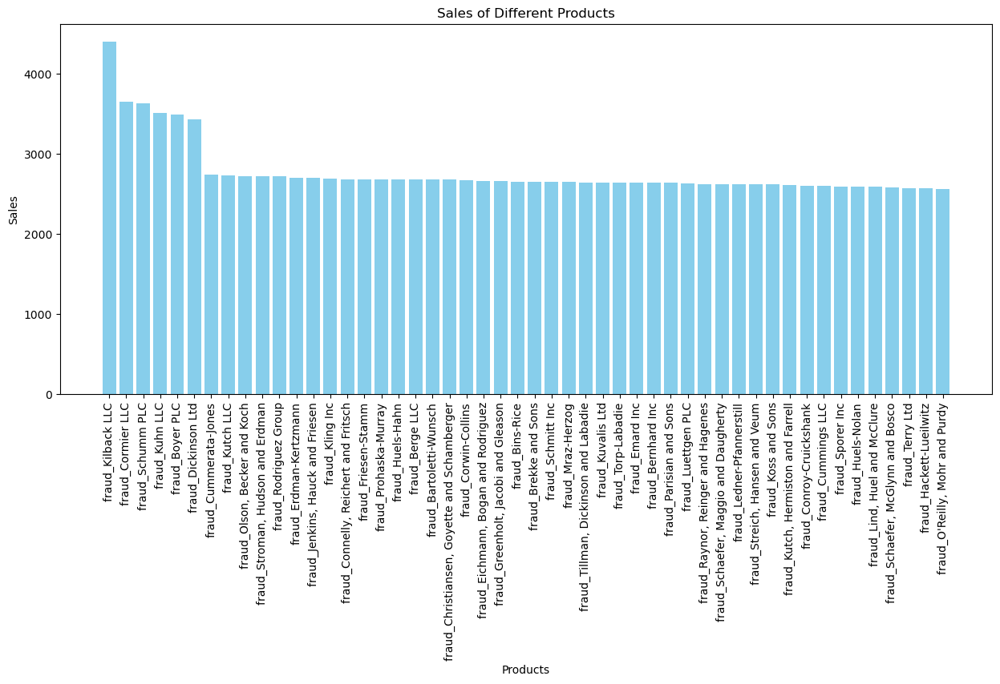

In [37]:
s = df['merchant'].value_counts().head(50)

# Create a bar chart
plt.figure(figsize=(15, 6))
plt.bar(s.index, s.values, color='skyblue')
plt.xlabel('Products')
plt.xticks(rotation=90)
plt.ylabel('Sales')
plt.title('Sales of Different Products')
plt.show()

## category

In [29]:
df['category']

0               misc_net
1            grocery_pos
2          entertainment
3          gas_transport
4               misc_pos
               ...      
1296670    entertainment
1296671      food_dining
1296672      food_dining
1296673      food_dining
1296674      food_dining
Name: category, Length: 1296675, dtype: object

In [30]:
df['category'].value_counts()

category
gas_transport     131659
grocery_pos       123638
home              123115
shopping_pos      116672
kids_pets         113035
shopping_net       97543
entertainment      94014
food_dining        91461
personal_care      90758
health_fitness     85879
misc_pos           79655
misc_net           63287
grocery_net        45452
travel             40507
Name: count, dtype: int64

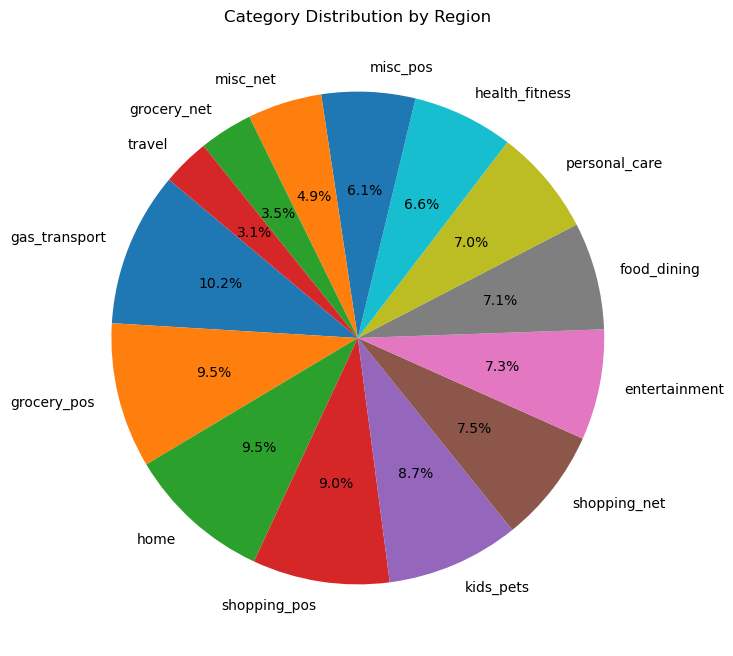

In [32]:
s = df['category'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(s.values, labels=s.index, autopct='%1.1f%%', startangle=140)
plt.title('Category Distribution by Region')
plt.show()

## amt

In [43]:
df['amt'].describe()

count   1296675.00
mean         70.35
std         160.32
min           1.00
25%           9.65
50%          47.52
75%          83.14
max       28948.90
Name: amt, dtype: float64

<Axes: ylabel='Frequency'>

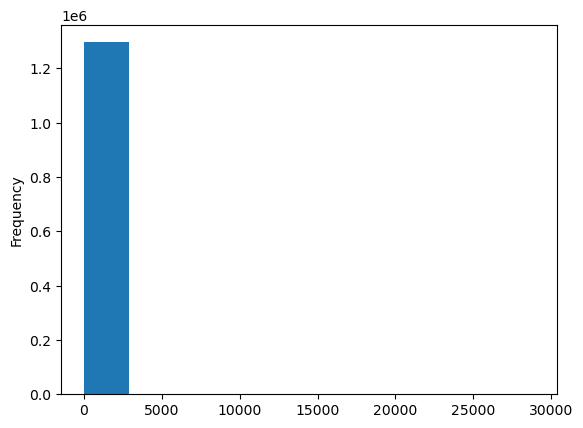

In [45]:
df['amt'].plot(kind='hist')

<Axes: ylabel='Density'>

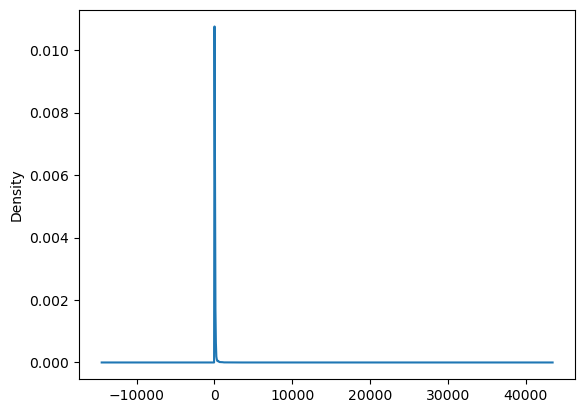

In [46]:
df['amt'].plot(kind='kde')

In [47]:
df['amt'].skew()

42.277873790051174

<Axes: >

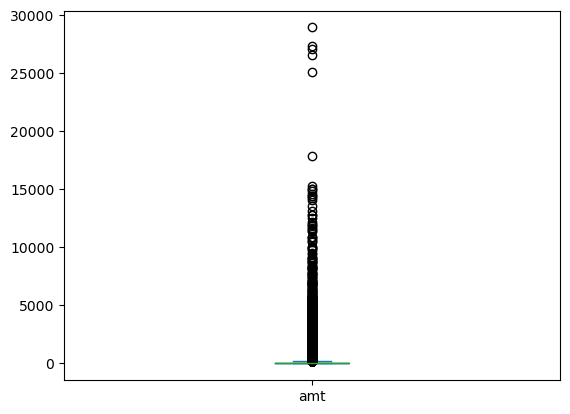

In [49]:
df['amt'].plot(kind='box')

## first + last

In [55]:
temp_s = df['first'] + " " + df['last']
temp_s

0                 Jennifer Banks
1                 Stephanie Gill
2                 Edward Sanchez
3                   Jeremy White
4                   Tyler Garcia
                   ...          
1296670           Erik Patterson
1296671            Jeffrey White
1296672    Christopher Castaneda
1296673            Joseph Murray
1296674            Jeffrey Smith
Length: 1296675, dtype: object

In [56]:
temp_s.value_counts()

Scott Martin         4618
Jeffrey Smith        3592
Barbara Taylor       3123
Monica Cohen         3123
Jessica Perez        3119
                     ... 
Mark Pennington         7
Angelica Lopez          7
Kelly Lawrence          7
Cody Blake              7
Danielle Schaefer       7
Name: count, Length: 973, dtype: int64

## gender

In [59]:
df['gender']

0          F
1          F
2          M
3          M
4          M
          ..
1296670    M
1296671    M
1296672    M
1296673    M
1296674    M
Name: gender, Length: 1296675, dtype: object

In [60]:
df['gender'].value_counts()

gender
F    709863
M    586812
Name: count, dtype: int64

<Axes: xlabel='gender'>

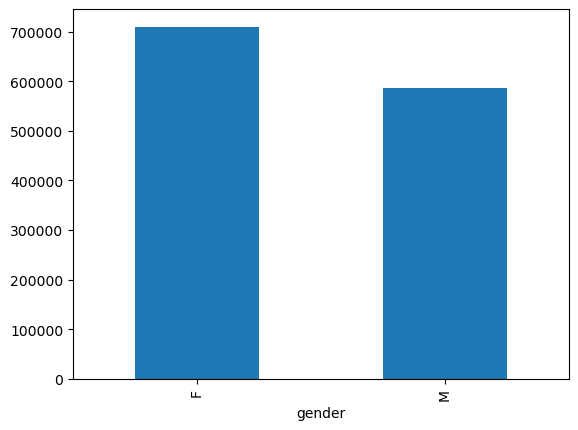

In [61]:
df['gender'].value_counts().plot(kind='bar')

In [62]:
df.sample()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
1169460,1169460,2020-05-03 14:04:51,4294040533480516,fraud_Ruecker-Mayert,kids_pets,38.12,Gail,Weaver,F,979 Stewart Lake,New Ellenton,SC,29809,33.41,-81.69,2206,Biomedical scientist,1986-12-31,87dbb22628660692fd0e2b70d00ec8f7,1367589891,32.58,-81.79,0


## street

In [6]:
df['street']

0                         561 Perry Cove
1           43039 Riley Greens Suite 393
2               594 White Dale Suite 530
3            9443 Cynthia Court Apt. 038
4                       408 Bradley Rest
                       ...              
1296670         162 Jessica Row Apt. 072
1296671    8617 Holmes Terrace Suite 651
1296672       1632 Cohen Drive Suite 639
1296673             42933 Ryan Underpass
1296674             135 Joseph Mountains
Name: street, Length: 1296675, dtype: object

In [7]:
df['street'].value_counts()

street
0069 Robin Brooks Apt. 695           3123
864 Reynolds Plains                  3123
8172 Robertson Parkways Suite 072    3119
4664 Sanchez Common Suite 930        3117
8030 Beck Motorway                   3113
                                     ... 
7281 Joshua Mills Apt. 077              7
3307 Ferguson Way                       7
9599 Washington Field Suite 238         7
3437 Ross Flat Apt. 592                 7
27954 Hall Mill Suite 575               7
Name: count, Length: 983, dtype: int64

In [8]:
df.sample()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
766240,766240,2019-11-24 09:49:44,6011367958204270,"fraud_Yost, Block and Koepp",misc_pos,8.20,Tammy,Ayers,F,1652 James Mews,Hinckley,OH,44233,41.24,-81.75,7646,Medical sales representative,1988-09-15,8d95b1ee948e628568180086aad0861d,1353750584,41.07,-82.58,0


## city

In [9]:
df['city']

0                    Moravian Falls
1                            Orient
2                        Malad City
3                           Boulder
4                          Doe Hill
                     ...           
1296670                       Hatch
1296671                   Tuscarora
1296672    High Rolls Mountain Park
1296673                   Manderson
1296674                        Sula
Name: city, Length: 1296675, dtype: object

In [10]:
df['city'].value_counts()

city
Birmingham     5617
San Antonio    5130
Utica          5105
Phoenix        5075
Meridian       5060
               ... 
Vacaville         7
Claypool          7
Karns City        7
Bruce             7
Chattanooga       7
Name: count, Length: 894, dtype: int64

## state

In [11]:
df['state']

0          NC
1          WA
2          ID
3          MT
4          VA
           ..
1296670    UT
1296671    MD
1296672    NM
1296673    SD
1296674    MT
Name: state, Length: 1296675, dtype: object

In [13]:
df['state'].value_counts()

state
TX    94876
NY    83501
PA    79847
CA    56360
OH    46480
MI    46154
IL    43252
FL    42671
AL    40989
MO    38403
MN    31714
AR    31127
NC    30266
WI    29368
VA    29250
SC    29190
KY    28475
IN    27580
IA    26985
OK    26671
MD    26193
GA    26063
WV    25691
NJ    24603
NE    24168
KS    22996
MS    21188
LA    20965
WY    19322
WA    18924
OR    18597
TN    17554
ME    16505
NM    16407
ND    14786
CO    13880
MA    12376
SD    12324
VT    11768
MT    11754
AZ    10770
UT    10699
NH     8278
CT     7702
NV     5607
ID     5545
DC     3613
HI     2559
AK     2120
RI      550
DE        9
Name: count, dtype: int64

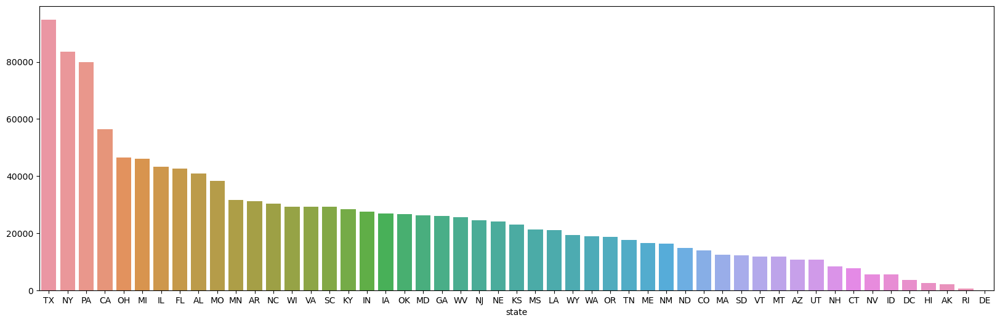

In [16]:
s = df['state'].value_counts()

plt.figure(figsize=(20, 6))
sns.barplot(x=s.index, y=s.values)
plt.show()

## zip

In [9]:
df['zip']

0          28654
1          99160
2          83252
3          59632
4          24433
           ...  
1296670    84735
1296671    21790
1296672    88325
1296673    57756
1296674    59871
Name: zip, Length: 1296675, dtype: int64

In [10]:
df['zip'].value_counts()

zip
73754    3646
34112    3613
48088    3597
82514    3527
49628    3123
         ... 
46510       7
16041       7
38915       7
10018       7
23523       7
Name: count, Length: 970, dtype: int64

In [11]:
df.sample()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
211709,211709,2019-04-18 08:16:25,3512365128314616,fraud_Bogisich Inc,grocery_pos,31.60,Francisco,Kemp,M,9554 Flores Drive,Arnold,MO,63010,38.43,-90.39,35439,Land/geomatics surveyor,1985-03-31,45c2e27e297db8d99aaace6829ac1f50,1334736985,38.82,-91.24,0


## lat, long

In [21]:
df[['lat', 'long']].isnull().sum()

lat     0
long    0
dtype: int64

In [22]:
df[['lat', 'long']].describe()

,lat,long
count,1296675.00,1296675.00
mean,38.54,-90.23
std,5.08,13.76
min,20.03,-165.67
25%,34.62,-96.80
50%,39.35,-87.48
75%,41.94,-80.16
max,66.69,-67.95


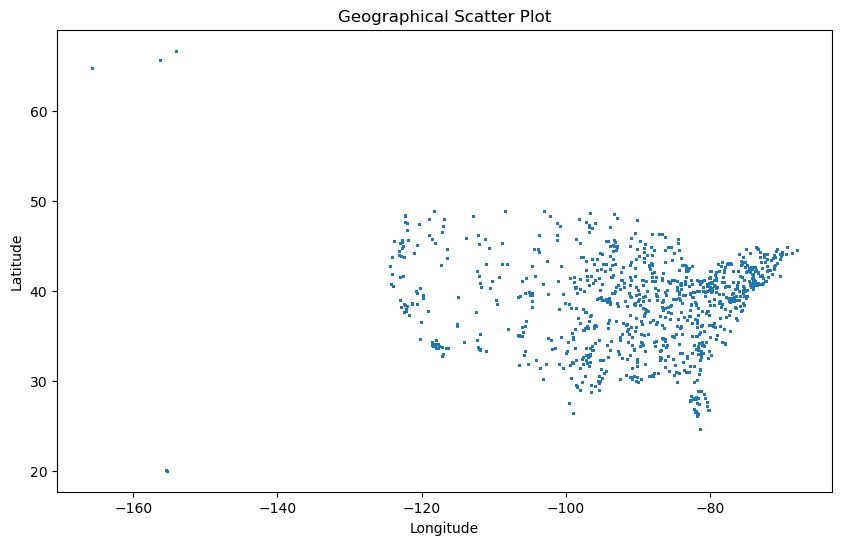

In [24]:
# Scatter Plot
plt.figure(figsize=(10, 6))
plt.scatter(df['long'], df['lat'], s=1, alpha=0.5)
plt.title('Geographical Scatter Plot')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [21]:
import folium
from folium.plugins import HeatMap
from IPython.display import display

In [19]:
# Interactive Map using Folium
# Center the map around the mean latitude and longitude

temp_df = df.sample(10000)

map_center = [temp_df['lat'].mean(), temp_df['long'].mean()]
map = folium.Map(location=map_center, zoom_start=4)

# Adding points to the map
for idx, row in temp_df.iterrows():
    folium.CircleMarker([row['lat'], row['long']],
                        radius=1,
                        color='blue',
                        fill=True,
                        fill_color='blue',
                        fill_opacity=0.6).add_to(map)

In [22]:
display(map)

In [23]:
# Heatmap on Folium
heat_data = [[row['lat'], row['long']] for index, row in temp_df.iterrows()]
HeatMap(heat_data).add_to(map)

display(map)

In [6]:
df.sample()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
645099,645099,2019-10-01 10:18:29,630451534402,"fraud_Olson, Becker and Koch",gas_transport,44.32,Rachel,Daniels,F,561 Little Plain Apt. 738,Wetmore,MI,49895,46.35,-86.63,765,Immunologist,1972-06-12,a6f4cf7e3da8e965698c36ab8b94c447,1349086709,47.14,-86.52,0


## city_pop

In [7]:
df['city_pop'].describe()

count   1296675.00
mean      88824.44
std      301956.36
min          23.00
25%         743.00
50%        2456.00
75%       20328.00
max     2906700.00
Name: city_pop, dtype: float64

<Axes: ylabel='Frequency'>

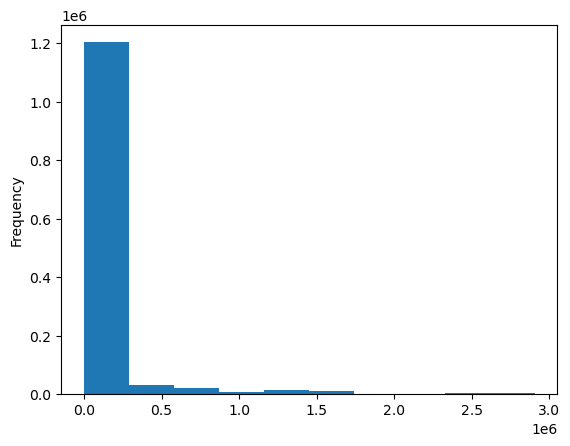

In [8]:
df['city_pop'].plot(kind='hist')

<Axes: ylabel='Density'>

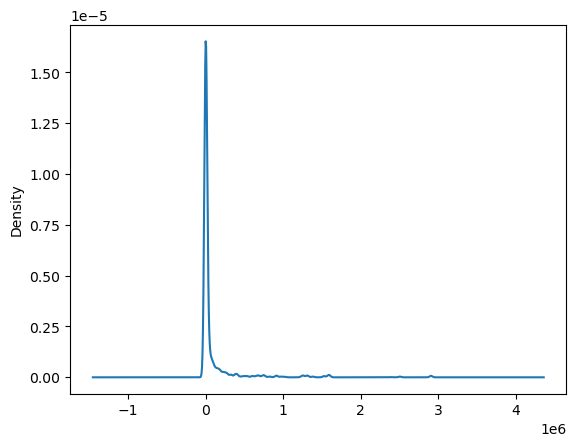

In [9]:
df['city_pop'].plot(kind='kde')

<Axes: >

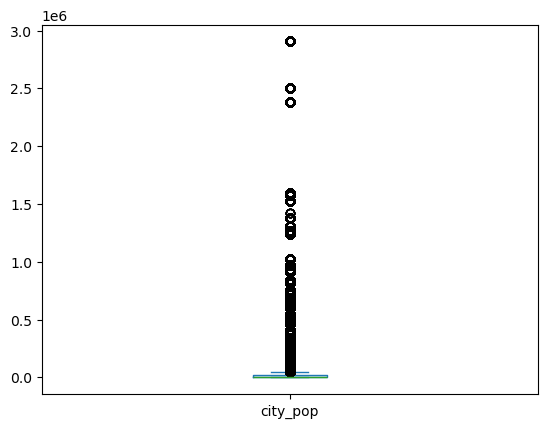

In [10]:
df['city_pop'].plot(kind='box')

In [11]:
df['city_pop'].skew()

5.593853066842104

In [12]:
df.sample()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
182964,182964,2019-04-05 20:31:16,4500002361389,"fraud_Graham, Hegmann and Hammes",food_dining,62.43,Joseph,Nixon,M,86882 Desiree Camp Suite 047,Tyaskin,MD,21865,38.28,-75.85,470,Music tutor,1965-04-07,a974c25ffc42e6bb2b41ca137869457f,1333657876,38.04,-76.06,0


## job

In [25]:
df['job'].value_counts()

job
Film/video editor             9779
Exhibition designer           9199
Naval architect               8684
Surveyor, land/geomatics      8680
Materials engineer            8270
                              ... 
Information officer              8
Veterinary surgeon               8
Ship broker                      7
Contracting civil engineer       7
Warehouse manager                7
Name: count, Length: 494, dtype: int64

<Axes: xlabel='job'>

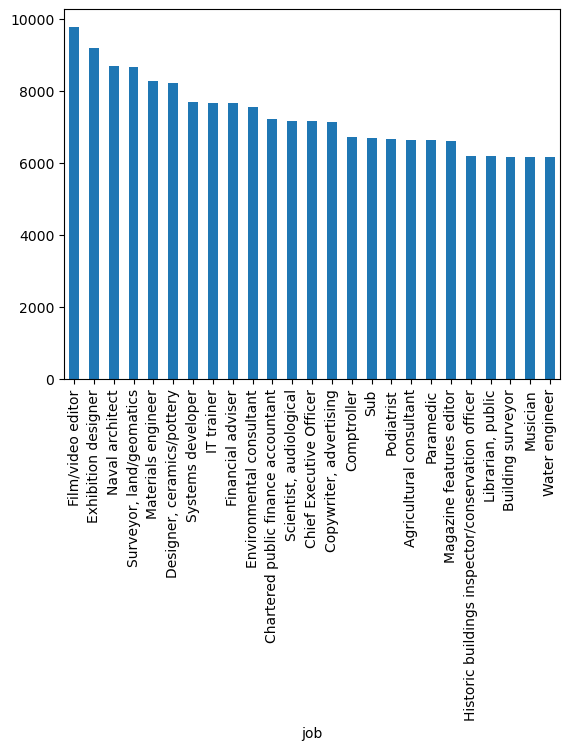

In [27]:
df['job'].value_counts().head(25).plot(kind='bar')

In [28]:
df.sample()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
306983,306983,2019-05-28 21:56:10,6540981358631302,"fraud_Weber, Thiel and Hammes",kids_pets,66.70,Bryan,Torres,M,152 James Centers Apt. 768,Detroit,MI,48221,42.43,-83.15,673342,Retail manager,1967-06-19,a8cbd145aa77b81d14adbf52aa5becb6,1338242170,42.20,-82.47,0


## dob

In [29]:
df['dob'] = pd.to_datetime(df['dob'])

In [30]:
# Summary statistics
df['dob'].describe()

count                          1296675
mean     1973-10-03 19:02:55.017178512
min                1924-10-30 00:00:00
25%                1962-08-13 00:00:00
50%                1975-11-30 00:00:00
75%                1987-02-22 00:00:00
max                2005-01-29 00:00:00
Name: dob, dtype: object

In [33]:
temp = df[['dob']]

# Extracting components
temp['year'] = temp['dob'].dt.year
temp['month'] = temp['dob'].dt.month
temp['day'] = temp['dob'].dt.day
temp['hour'] = temp['dob'].dt.hour
temp['minute'] = temp['dob'].dt.minute
temp['second'] = temp['dob'].dt.second
temp['day_of_week'] = temp['dob'].dt.dayofweek
temp['week_of_year'] = temp['dob'].dt.isocalendar().week

# Inspecting the data with new columns
temp.head()

C:\Users\Acer\AppData\Local\Temp\ipykernel_1612\2110684180.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp['year'] = temp['dob'].dt.year
C:\Users\Acer\AppData\Local\Temp\ipykernel_1612\2110684180.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp['month'] = temp['dob'].dt.month
C:\Users\Acer\AppData\Local\Temp\ipykernel_1612\2110684180.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See 

,dob,year,month,day,hour,minute,second,day_of_week,week_of_year
0,1988-03-09,1988,3,9,0,0,0,2,10
1,1978-06-21,1978,6,21,0,0,0,2,25
2,1962-01-19,1962,1,19,0,0,0,4,3
3,1967-01-12,1967,1,12,0,0,0,3,2
4,1986-03-28,1986,3,28,0,0,0,4,13


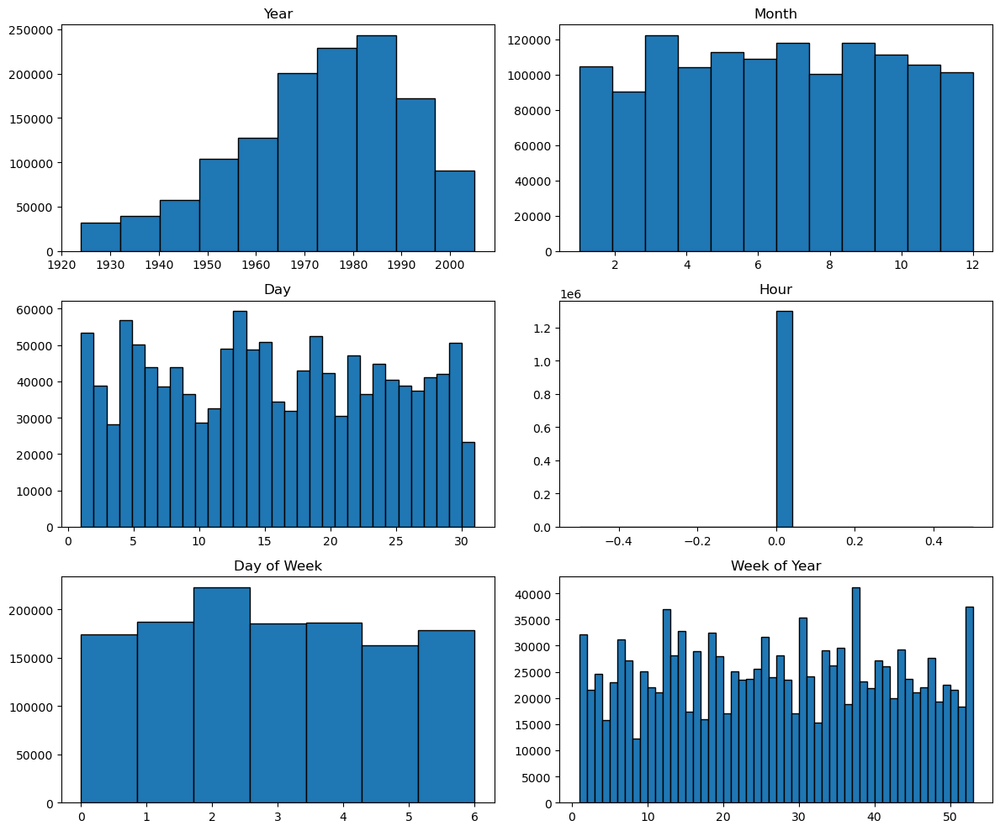

In [34]:
# Histograms of different time components
fig, axs = plt.subplots(3, 2, figsize=(12, 10))
axs[0, 0].hist(temp['year'], bins=10, edgecolor='black')
axs[0, 0].set_title('Year')
axs[0, 1].hist(temp['month'], bins=12, edgecolor='black')
axs[0, 1].set_title('Month')
axs[1, 0].hist(temp['day'], bins=31, edgecolor='black')
axs[1, 0].set_title('Day')
axs[1, 1].hist(temp['hour'], bins=24, edgecolor='black')
axs[1, 1].set_title('Hour')
axs[2, 0].hist(temp['day_of_week'], bins=7, edgecolor='black')
axs[2, 0].set_title('Day of Week')
axs[2, 1].hist(temp['week_of_year'], bins=52, edgecolor='black')
axs[2, 1].set_title('Week of Year')
plt.tight_layout()
plt.show()

In [35]:
df.sample()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
548962,548962,2019-08-23 08:00:04,4809701904914,fraud_Kiehn Inc,grocery_pos,176.27,Sabrina,Nolan,F,312 Eric Expressway Apt. 014,Phenix City,AL,36869,32.42,-85.08,59744,Chemical engineer,1984-02-07,b6786f379c8d0238d428346a409a6093,1345708804,32.07,-84.71,0


## trans_num

In [38]:
df['trans_num'].nunique()

1296675

## unix_time

In [40]:
df['unix_time'].nunique()

1274823

In [41]:
df['unix_time'].value_counts()

unix_time
1370177227    4
1335110521    4
1370050667    4
1367602155    3
1364686521    3
             ..
1342203558    1
1342203557    1
1342203554    1
1342203541    1
1371816817    1
Name: count, Length: 1274823, dtype: int64

In [42]:
df.sample()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
998424,998424,2020-02-13 07:57:42,3596357274378601,fraud_Erdman-Kertzmann,gas_transport,34.95,David,Everett,M,4138 David Fall,Morrisdale,PA,16858,41.00,-78.24,3688,Advice worker,1973-05-27,d3dfdc0e6888c2a330f303f6358ff4cd,1360742262,41.73,-78.85,0


## merch_lat, merch_long

In [43]:
df[['merch_lat', 'merch_long']].isnull().sum()

merch_lat     0
merch_long    0
dtype: int64

In [44]:
df[['merch_lat', 'merch_long']].describe()

,merch_lat,merch_long
count,1296675.00,1296675.00
mean,38.54,-90.23
std,5.11,13.77
min,19.03,-166.67
25%,34.73,-96.90
50%,39.37,-87.44
75%,41.96,-80.24
max,67.51,-66.95


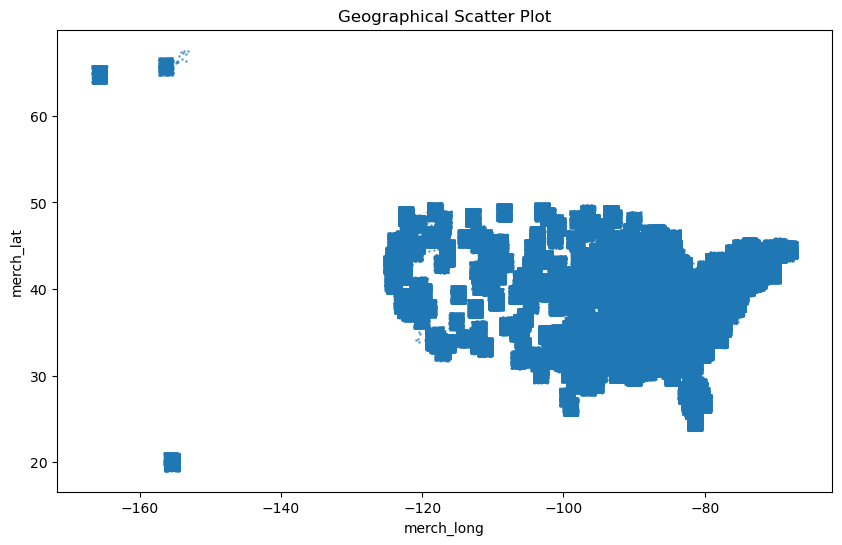

In [45]:
# Scatter Plot
plt.figure(figsize=(10, 6))
plt.scatter(df['merch_long'], df['merch_lat'], s=1, alpha=0.5)
plt.title('Geographical Scatter Plot')
plt.xlabel('merch_long')
plt.ylabel('merch_lat')
plt.show()

In [46]:
df.sample()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
169507,169507,2019-03-30 19:05:14,3502088871723054,fraud_Bernhard-Lesch,food_dining,10.56,Scott,Martin,M,31472 Cody Place Suite 740,Kensington,MD,20895,39.03,-77.08,19054,Operations geologist,1976-09-08,aeeed74f6b822ca034ab2555fe5c6291,1333134314,38.98,-77.27,0


### is_fraud

In [47]:
df['is_fraud']

0          0
1          0
2          0
3          0
4          0
          ..
1296670    0
1296671    0
1296672    0
1296673    0
1296674    0
Name: is_fraud, Length: 1296675, dtype: int64

In [48]:
df['is_fraud'].value_counts()

is_fraud
0    1289169
1       7506
Name: count, dtype: int64

<Axes: xlabel='is_fraud'>

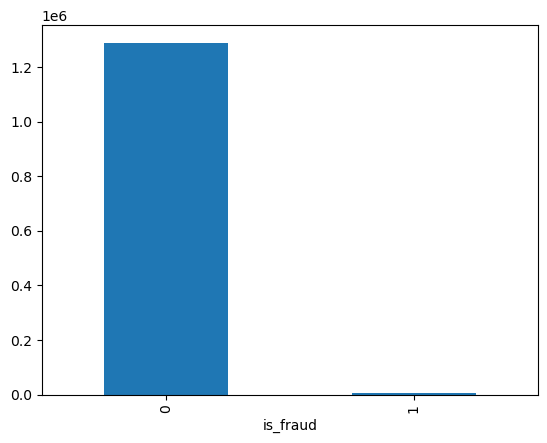

In [49]:
df['is_fraud'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

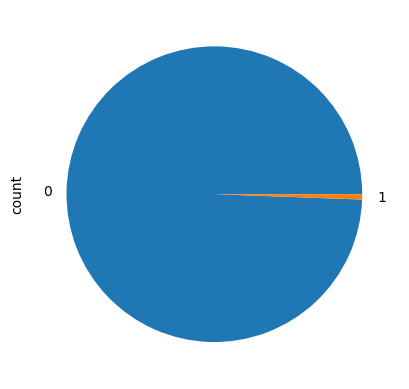

In [50]:
df['is_fraud'].value_counts().plot(kind='pie')